# Automatic Zebra and Impala Detection
## IEEE AFRICON 20th September 2023 Presentation 
### By Yuri Njathi

!['All logos'](figures/joint_logos.PNG)


# Manual Annotation

We collect 200 to 400 images per week.

Human annotation is laborious, automatic detection of animals in images or videos reduces the time taken.

Also, if we are at larger scales say collection of thousands, tens of thousands or hundred of thousands of images manual annotation will become unreasonable.

# Automatic Impala and Zebra Detection in Images and Videos

!['Animal detection'](figures/conservancy-animals-detected.PNG)


70 % of the images with animals have either an impala or a zebra 

We could also do automatic false trigger or non-animal trigger detection since 60% to 80% of the raw unpublished data  was either a false trigger or triggered by a human , birds or even insects. 

The purpose here is to locate the animals in images and videos, detect which animal it is then verify.  

In [1]:
#file and folder libraries
#!pip install pandas
import pandas as pd
import numpy as np

#!pip install torchvision
import os
from datetime import datetime

#Mapping libraries
#!pip install geopandas
#import geopandas as gpd
#!pip install pyshape
#from shapely.geometry import Point, Polygon

#Import specific function 'from_epsg' from fiona module
#from fiona.crs import from_epsg

#pytorch related
#!pip install torch
#!pip install matplotlib
#!pip install opencv-python
import torch
import matplotlib.pyplot as plt
import cv2


def detect_and_verify(source):
    img = (source)#('dataset/images/a.jpg')
    results = model(img)
    print(results)

    %matplotlib inline 
    plt.imshow(np.squeeze(results.render()))
    plt.show()
    
def detect_class(source):
    '''
    returns filename, impala_count, zebra_count, other_count
    '''
    img = (source)
    results = model(img)
    print(results)
    %matplotlib inline 
    plt.imshow(np.squeeze(results.render()))
    plt.show()

    r = str(results).split()
    impala_count = 0
    zebra_count = 0
    other_count = 0
    if 'impala' in r or 'impala,' in r:
        impala_count = 1
    if 'impalas' in r:
        index = r.index('impalas')
        impala_count = r[index-1]
    if 'impalas,' in r:
        index = r.index('impalas,')
        impala_count = r[index-1]
    if 'zebra' in r or 'zebra,' in r :
        zebra_count = 1
    if 'zebras' in r:
        index = r.index('zebras')
        zebra_count = r[index-1]
    if 'zebras,' in r:
        index = r.index('zebras,')
        zebra_count = r[index-1]
    if 'other' in r or 'other,' in r :
        other_count = 1
    if 'others' in r:
        index = r.index('others')
        other_count = r[index-1]
    if 'others,' in r:
        index = r.index('others,')
        other_count = r[index-1]

    return source, impala_count, zebra_count, other_count

C:\Users\Yuri\anaconda3\envs\olpejeta20thNov2022\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# !pip uninstall torch

In [3]:
#this is a open source pretrained model
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...


In [4]:
#load animal detection model
#model = torch.hub.load('ultralytics/yolov5', 'custom', path=r'models/lasst.pt',verbose=False,source='local')
model = torch.hub.load(r'yolov5', 'custom', path=r'models/lasst.pt', source='local',force_reload=True)
print('Detection model has loaded')

#Set the confidence which you require from the model
model.conf = 0.45

YOLOv5  v7.0-211-g94e943e Python-3.10.6 torch-1.13.0+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients
Adding AutoShape... 


Detection model has loaded


image 1/1: 720x1280 1 impala
Speed: 198.3ms pre-process, 723.8ms inference, 34.1ms NMS per image at shape (1, 3, 384, 640)


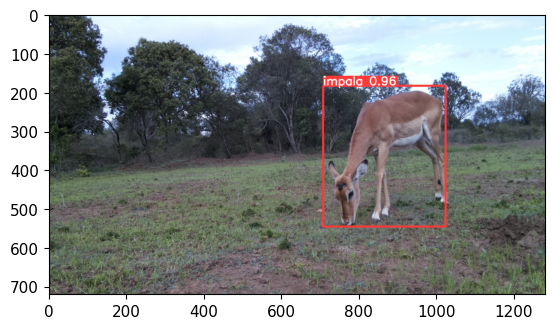

In [6]:
detect_and_verify('dataset/images/impala.jpg')

image 1/1: 720x1280 1 other
Speed: 136.8ms pre-process, 748.6ms inference, 10.0ms NMS per image at shape (1, 3, 384, 640)


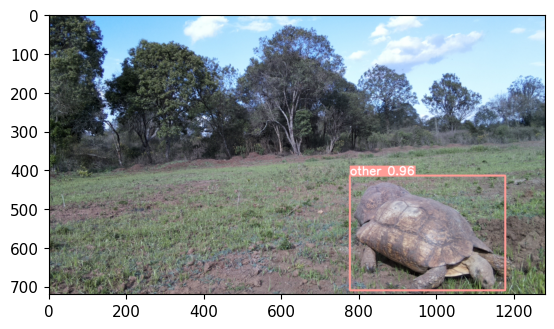

In [7]:
detect_and_verify(r'dataset\images\tortoise.jpg')

image 1/1: 720x1280 1 other
Speed: 44.5ms pre-process, 635.6ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


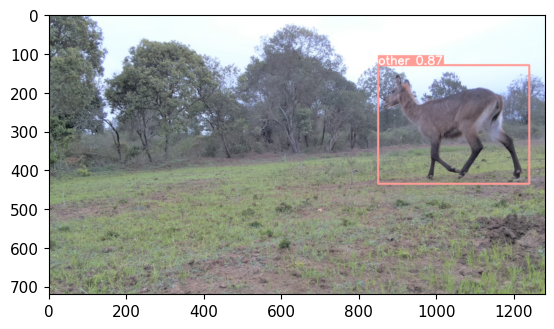

In [8]:
detect_and_verify('dataset/images/waterbuck.jpg')

image 1/1: 720x1280 4 impalas, 1 other
Speed: 42.8ms pre-process, 633.4ms inference, 4.2ms NMS per image at shape (1, 3, 384, 640)


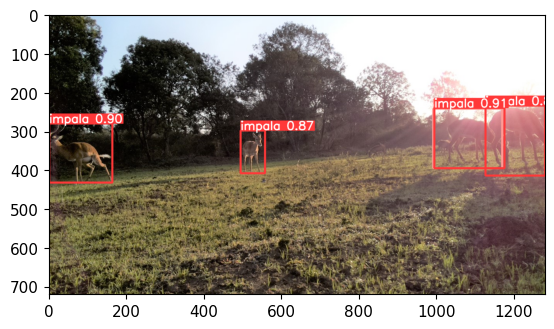

In [9]:
detect_and_verify('dataset/images/impalas-warthogs.jpg')

image 1/1: 3072x4608 4 impalas, 1 other, 1 zebra
Speed: 494.9ms pre-process, 801.8ms inference, 0.0ms NMS per image at shape (1, 3, 448, 640)


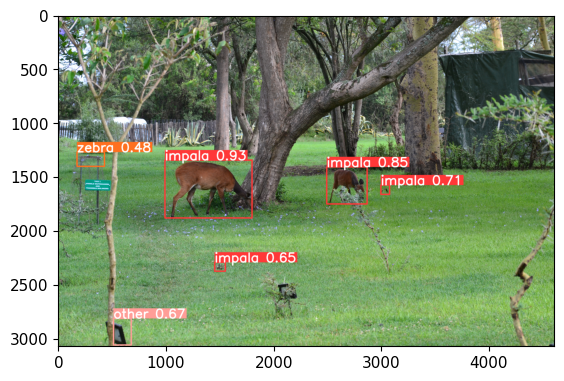

In [10]:
detect_and_verify('dataset/images/DSC_0007.JPG')

## Automatic detection on multiple images

- It took 2 weeks to manually annotate 8554 images

- Automatically it takes about an hour and 20 minutes but it crashed my computer.

- This was a rate of 25 images per hour

image 1/1: 720x1280 2 others
Speed: 92.4ms pre-process, 722.2ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


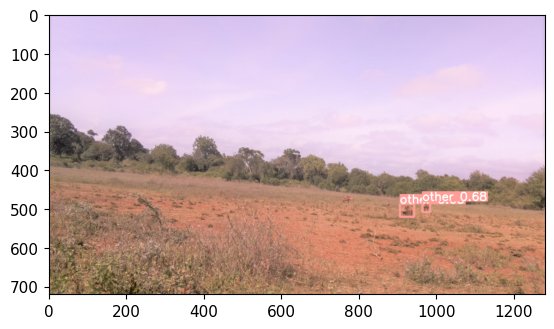

2021-06-25-15-02-43.jpg    0  Impalas  0  Zebras  2  Others

image 1/1: 720x1280 1 impala, 1 other
Speed: 60.5ms pre-process, 676.2ms inference, 10.0ms NMS per image at shape (1, 3, 384, 640)


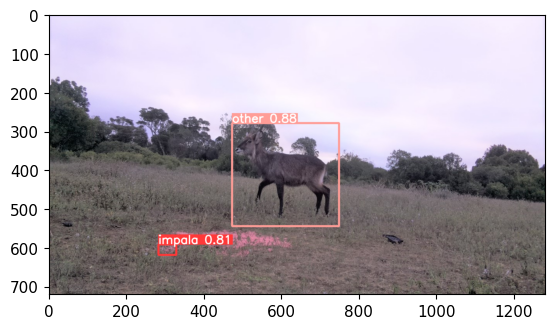

2021-07-01-06-59-59.jpg    1  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 1 other
Speed: 56.0ms pre-process, 671.9ms inference, 2.0ms NMS per image at shape (1, 3, 384, 640)


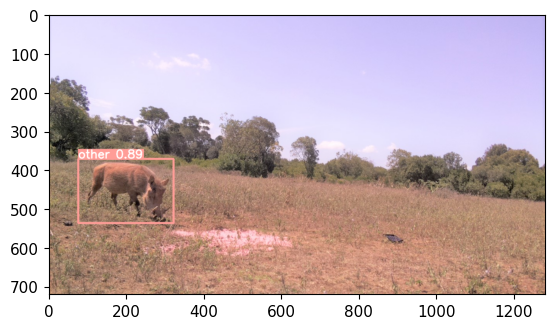

2021-07-01-11-23-54.jpg    0  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 3 impalas
Speed: 54.7ms pre-process, 829.2ms inference, 5.6ms NMS per image at shape (1, 3, 384, 640)


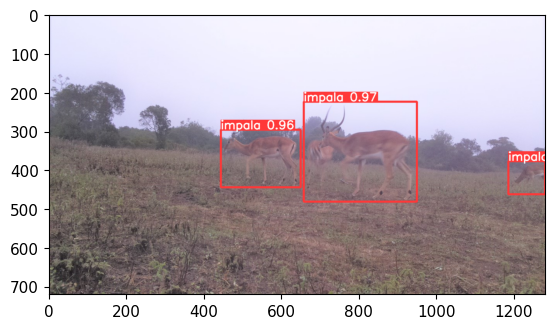

2021-07-09-06-40-57.jpg    3  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 2 others
Speed: 55.4ms pre-process, 867.8ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


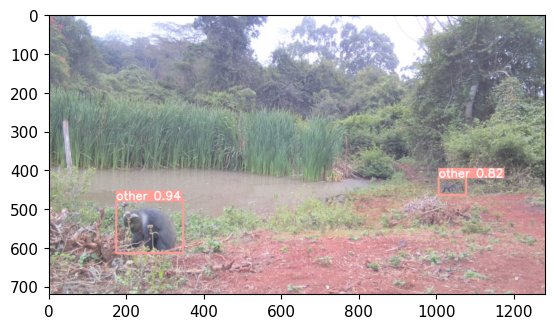

2021-08-08-10-27-46.jpg    0  Impalas  0  Zebras  2  Others

image 1/1: 720x1280 2 impalas, 2 others
Speed: 61.7ms pre-process, 892.7ms inference, 2.1ms NMS per image at shape (1, 3, 384, 640)


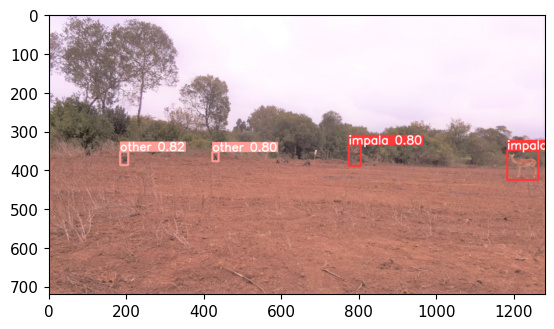

2021-08-14-12-54-51.jpg    2  Impalas  0  Zebras  2  Others

image 1/1: 720x1280 1 impala
Speed: 93.0ms pre-process, 741.1ms inference, 2.2ms NMS per image at shape (1, 3, 384, 640)


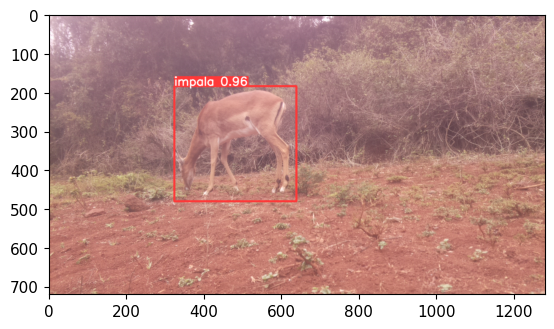

2021-09-05-10-30-00.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 (no detections)
Speed: 26.3ms pre-process, 728.9ms inference, 1.8ms NMS per image at shape (1, 3, 384, 640)


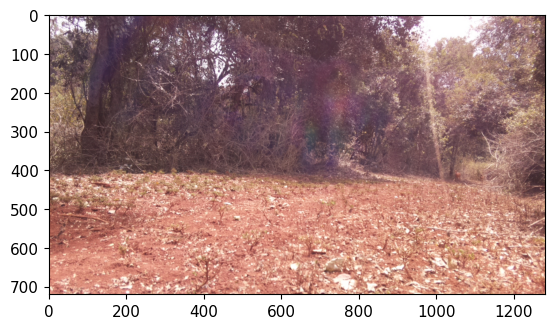

2021-09-18-10-48-36.jpg    0  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 impala
Speed: 64.1ms pre-process, 898.3ms inference, 1.0ms NMS per image at shape (1, 3, 384, 640)


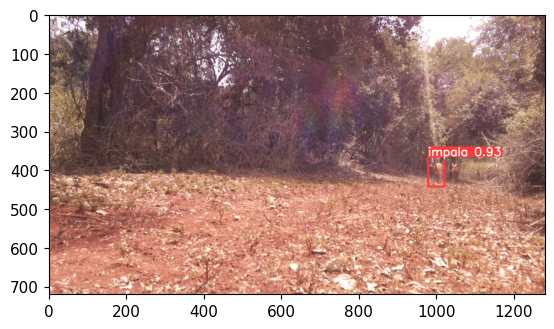

2021-09-18-10-49-53.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 impala, 1 other
Speed: 48.8ms pre-process, 822.9ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


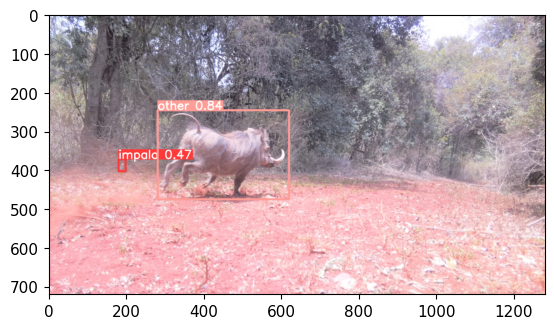

2021-09-18-13-22-13.jpg    1  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 1 impala
Speed: 63.7ms pre-process, 918.7ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


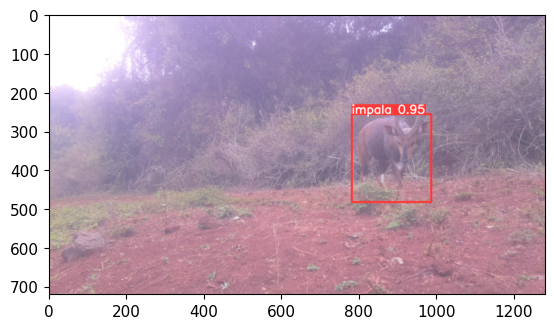

2021-09-23-08-36-33.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 impala
Speed: 67.3ms pre-process, 1021.7ms inference, 4.1ms NMS per image at shape (1, 3, 384, 640)


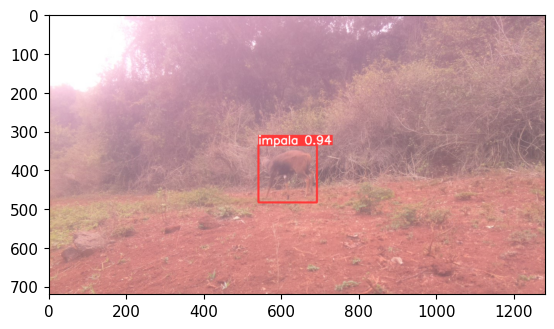

2021-09-23-09-08-44.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 impala, 1 other
Speed: 49.3ms pre-process, 816.5ms inference, 1.8ms NMS per image at shape (1, 3, 384, 640)


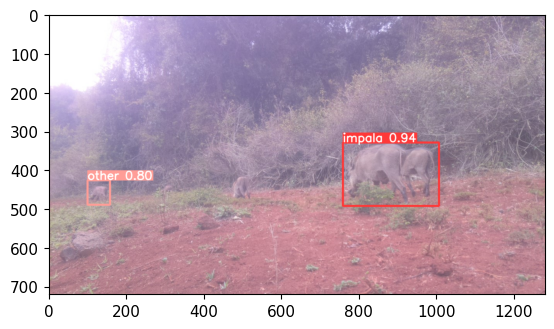

2021-09-25-10-45-28.jpg    1  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 1 other
Speed: 60.7ms pre-process, 926.0ms inference, 3.4ms NMS per image at shape (1, 3, 384, 640)


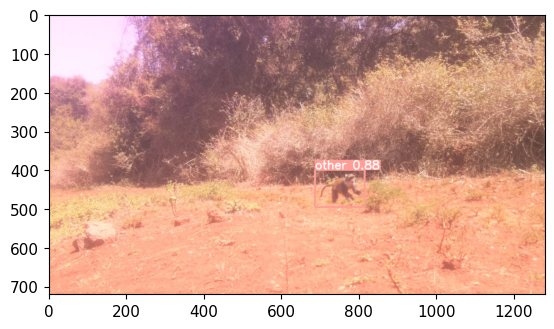

2021-09-29-13-37-34.jpg    0  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 1 impala
Speed: 66.7ms pre-process, 855.8ms inference, 8.5ms NMS per image at shape (1, 3, 384, 640)


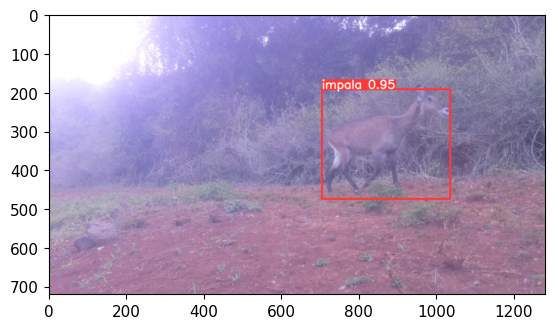

2021-09-29-17-57-33.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 2 zebras
Speed: 74.9ms pre-process, 761.5ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


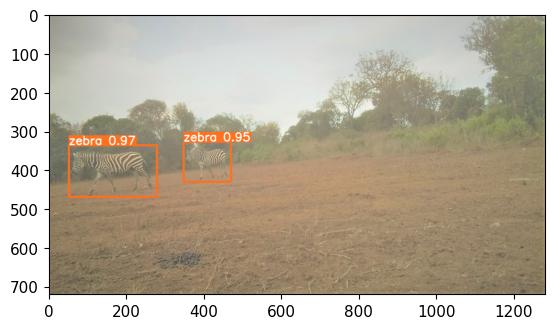

2021-10-07-15-37-41.jpg    0  Impalas  2  Zebras  0  Others

image 1/1: 720x1280 2 zebras
Speed: 43.6ms pre-process, 745.7ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


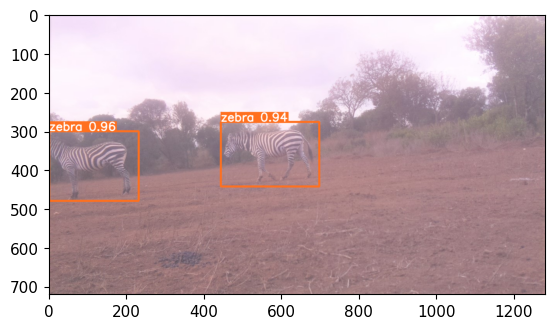

2021-10-08-17-34-09.jpg    0  Impalas  2  Zebras  0  Others

image 1/1: 720x1280 (no detections)
Speed: 83.0ms pre-process, 898.6ms inference, 1.9ms NMS per image at shape (1, 3, 384, 640)


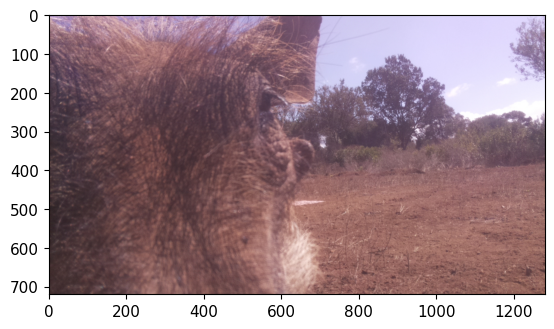

2021-10-14-10-23-55.jpg    0  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 2 others
Speed: 92.9ms pre-process, 917.1ms inference, 6.8ms NMS per image at shape (1, 3, 384, 640)


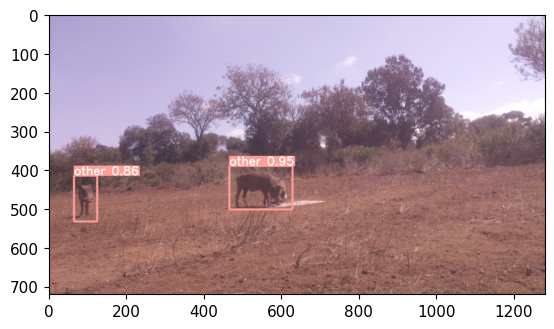

2021-10-14-10-24-28.jpg    0  Impalas  0  Zebras  2  Others

image 1/1: 720x1280 5 others
Speed: 80.5ms pre-process, 1004.9ms inference, 3.6ms NMS per image at shape (1, 3, 384, 640)


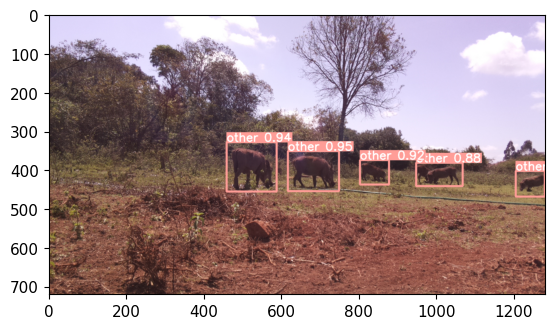

2021-10-14-10-36-30.jpg    0  Impalas  0  Zebras  5  Others

image 1/1: 720x1280 2 others
Speed: 82.3ms pre-process, 720.6ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


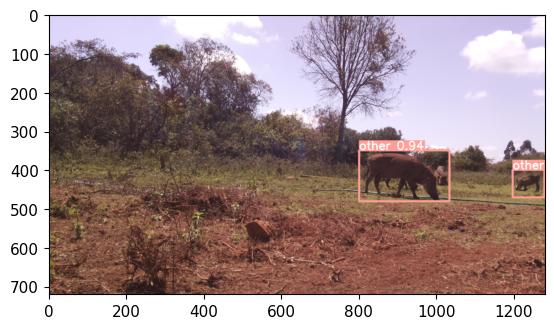

2021-10-14-10-36-47.jpg    0  Impalas  0  Zebras  2  Others

image 1/1: 720x1280 1 impala
Speed: 44.0ms pre-process, 798.1ms inference, 3.5ms NMS per image at shape (1, 3, 384, 640)


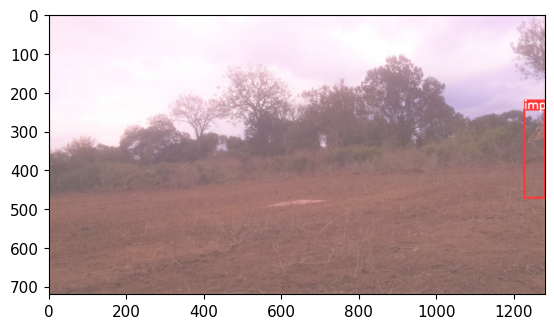

2021-10-14-16-16-13.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 impala, 1 other
Speed: 70.3ms pre-process, 713.9ms inference, 3.3ms NMS per image at shape (1, 3, 384, 640)


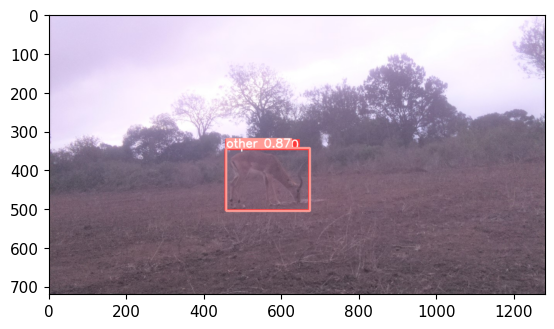

2021-10-15-06-08-22.jpg    1  Impalas  0  Zebras  1  Others

image 1/1: 720x1280 4 impalas
Speed: 43.8ms pre-process, 847.3ms inference, 2.0ms NMS per image at shape (1, 3, 384, 640)


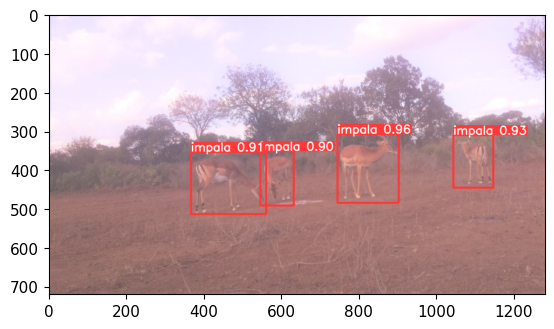

2021-10-15-16-45-07.jpg    4  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 2 impalas
Speed: 51.9ms pre-process, 666.4ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


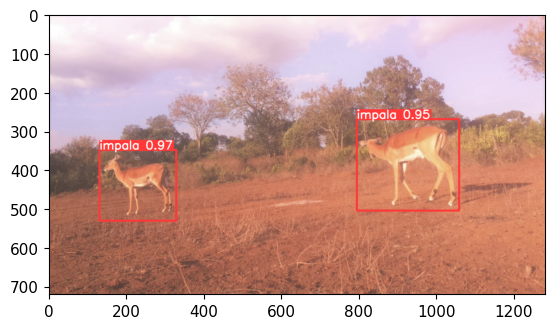

2021-10-15-17-25-48.jpg    2  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 2 impalas
Speed: 55.3ms pre-process, 723.7ms inference, 2.0ms NMS per image at shape (1, 3, 384, 640)


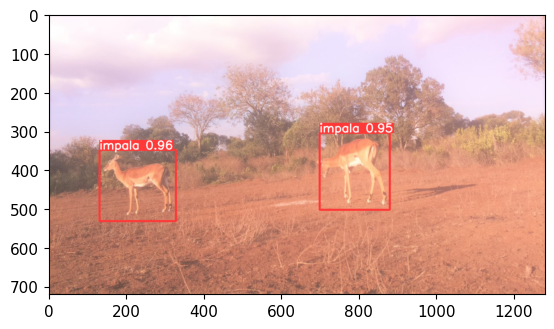

2021-10-15-17-25-50.jpg    2  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 3 zebras
Speed: 52.1ms pre-process, 882.3ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


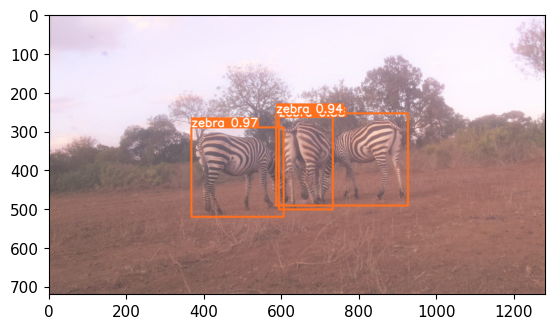

2021-10-15-17-56-48.jpg    0  Impalas  3  Zebras  0  Others

image 1/1: 720x1280 1 zebra
Speed: 41.7ms pre-process, 870.4ms inference, 2.3ms NMS per image at shape (1, 3, 384, 640)


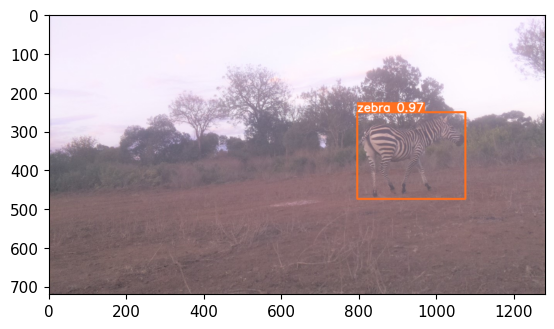

2021-10-15-18-11-18.jpg    0  Impalas  1  Zebras  0  Others

image 1/1: 720x1280 1 zebra
Speed: 52.6ms pre-process, 653.7ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


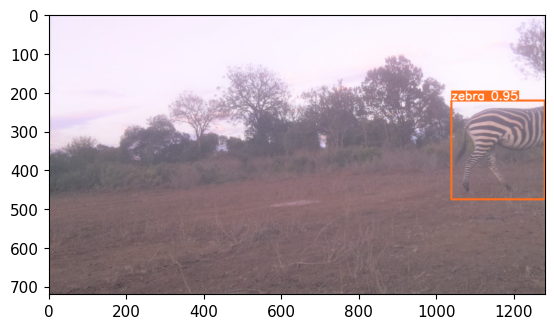

2021-10-15-18-14-17.jpg    0  Impalas  1  Zebras  0  Others

image 1/1: 720x1280 1 impala
Speed: 70.4ms pre-process, 732.0ms inference, 1.1ms NMS per image at shape (1, 3, 384, 640)


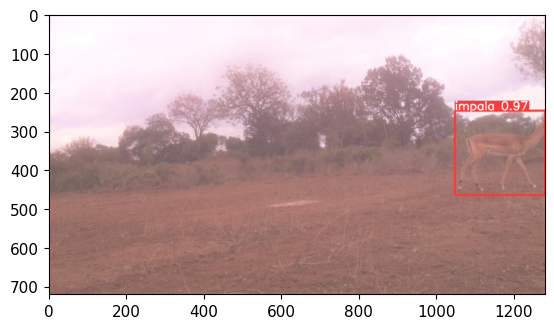

2021-10-16-15-44-40.jpg    1  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 1 zebra
Speed: 75.6ms pre-process, 873.9ms inference, 3.5ms NMS per image at shape (1, 3, 384, 640)


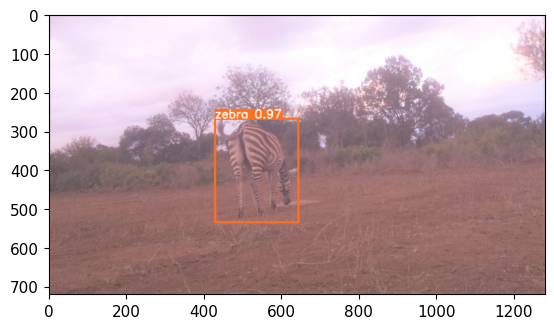

2021-10-16-18-09-31.jpg    0  Impalas  1  Zebras  0  Others

image 1/1: 720x1280 2 zebras
Speed: 50.1ms pre-process, 724.9ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


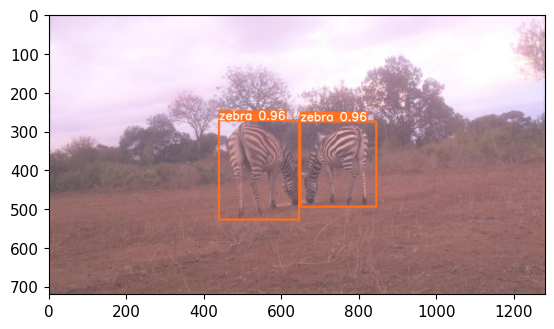

2021-10-16-18-09-51.jpg    0  Impalas  2  Zebras  0  Others

image 1/1: 720x1280 3 zebras
Speed: 56.2ms pre-process, 805.6ms inference, 5.3ms NMS per image at shape (1, 3, 384, 640)


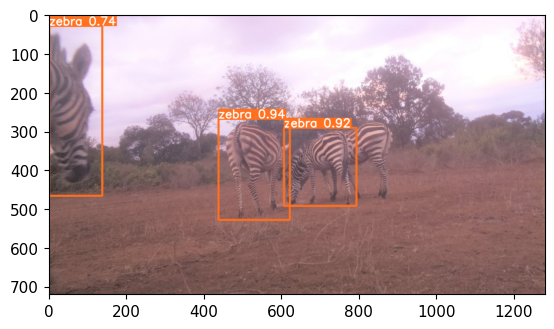

2021-10-16-18-10-07.jpg    0  Impalas  3  Zebras  0  Others

image 1/1: 720x1280 (no detections)
Speed: 80.1ms pre-process, 975.1ms inference, 1.0ms NMS per image at shape (1, 3, 384, 640)


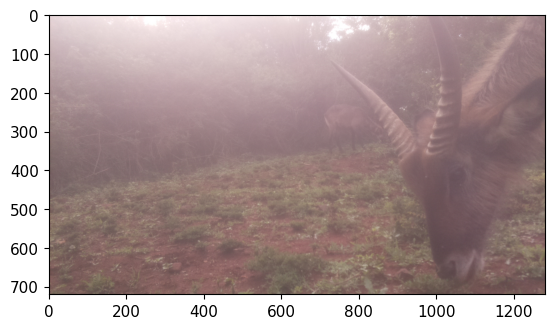

2021-12-25-16-43-14.jpg    0  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 (no detections)
Speed: 81.4ms pre-process, 982.1ms inference, 2.7ms NMS per image at shape (1, 3, 384, 640)


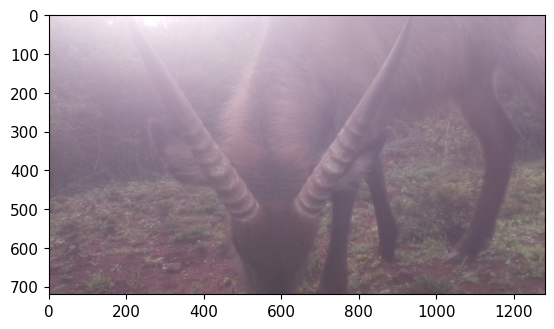

2021-12-25-16-43-55.jpg    0  Impalas  0  Zebras  0  Others

image 1/1: 720x1280 (no detections)
Speed: 63.8ms pre-process, 645.2ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


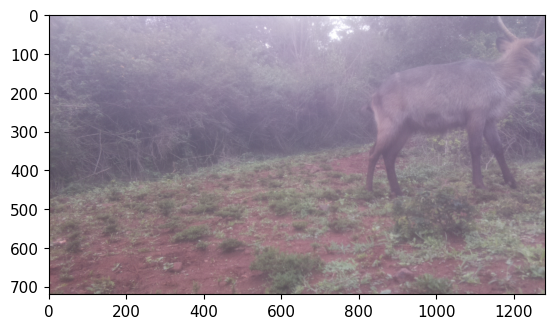

2021-12-25-17-10-21.jpg    0  Impalas  0  Zebras  0  Others

Timetaken :  0:01:06.442489  HH:MM:SS
Files processed 36


,Filename,Impala_count,Zebra_count,Other_count
0,2021-06-25-15-02-43.jpg,0,0,2
1,2021-07-01-06-59-59.jpg,1,0,1
2,2021-07-01-11-23-54.jpg,0,0,1
3,2021-07-09-06-40-57.jpg,3,0,0
4,2021-08-08-10-27-46.jpg,0,0,2
5,2021-08-14-12-54-51.jpg,2,0,2
6,2021-09-05-10-30-00.jpg,1,0,0
7,2021-09-18-10-48-36.jpg,0,0,0
8,2021-09-18-10-49-53.jpg,1,0,0
9,2021-09-18-13-22-13.jpg,1,0,1


In [11]:
#on multiple images
start = datetime.now()
#400 images with impalas or zebras
df_auto = pd.DataFrame()
Species = []
source = './dataset/data/processing/'
Filenames = os.listdir(source)
files = []
impalas = []
zebras = []
others = []

for image in Filenames[:]:
    try:
        _,b,c,d = detect_class(source+image)
        files.append(image)
        impalas.append(b)
        zebras.append(c)
        others.append(d)
        print(image,'  ',b,' Impalas ',c,' Zebras ',d,' Others\n')
    except:
        pass
df_auto['Filename'] = files
df_auto['Impala_count'] = impalas
df_auto['Zebra_count'] = zebras
df_auto['Other_count'] = others
end = datetime.now()
print('Timetaken : ',end-start,' HH:MM:SS')
print('Files processed',df_auto.shape[0])
df_auto.head(25)


In [12]:
df_sightings = pd.DataFrame()
df = pd.read_excel('dataset/camera_trap_dataset_annotation.xlsx')
file_longitude = {}
file_latitude = {}
for i, row in df.iterrows():
    file_latitude[row['Filename']] = row['Latitude']
    file_longitude[row['Filename']] = row['Longitude']

In [13]:
#add location
longs = []
lats = []
for i, row in df_auto.iterrows():
    lats.append(file_latitude[row['Filename']])
    longs.append(file_longitude[row['Filename']])
df_auto['Latitude'] = lats 
df_auto['Longitude'] = longs

In [14]:
#Lets look at our data before we save it
df_auto.head()

,Filename,Impala_count,Zebra_count,Other_count,Latitude,Longitude
0,2021-06-25-15-02-43.jpg,0,0,2,-0.388557,36.961408
1,2021-07-01-06-59-59.jpg,1,0,1,-0.390386,36.962331
2,2021-07-01-11-23-54.jpg,0,0,1,-0.390386,36.962331
3,2021-07-09-06-40-57.jpg,3,0,0,-0.390386,36.962331
4,2021-08-08-10-27-46.jpg,0,0,2,-0.390386,36.962348


In [16]:
df_auto.to_csv('csvs/dekut_animal_counts.csv',index=False)

In [ ]:
cap = cv2.VideoCapture(r"")
while cap.isOpened():
    ret, frame = cap.read()
    
    # Make detections 
    results = model(frame)
    
    imshow_ = cv2.imshow('Detection of Zebras and Impalas', np.squeeze(results.render()))
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
cap = cv2.VideoCapture(r"ADD YOUR VIDEO PATH HERE")
while cap.isOpened():
    ret, frame = cap.read()
    
    # Make detections 
    results = model(frame)
    
    imshow_ = cv2.imshow('Detection of Zebras and Impalas', np.squeeze(results.render()))
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()